# Post-Paper Analysis — Model Roster Update, Writing Style, and Score Structure

Everything analyzed since `tex/paper.tex` was drafted. The paper's core results
(win rates, fairness, agreement, strictness) covered the *original* model roster;
this notebook covers two things the paper does not: (1) how those results change
under the **updated roster**, and (2) an entirely new line of inquiry into
**cover-letter writing style** — what models produce, what evaluators reward,
and how much of the score is explained by style vs. structural factors.

**Roster change:**

| | Removed | Added |
|---|---|---|
| Evaluators | Gemini 2.0 Flash | GPT-5, Gemini 3.5 Flash, Claude Sonnet 4.6 |
| Writers | DeepSeek Chat, Gemini 2.0 Flash | GPT-5, Gemini 3.5 Flash, Claude Sonnet 4.6, DeepSeek V3.2, DeepSeek V4 Flash |

Current roster: **9 evaluators**, **11 writers** (all evaluators are also writers, plus
DeepSeek R1 8B and Llama 3.1 8B as writer-only models).

**Contents:**
1. Scoring reproducibility with the updated roster
2. What do models produce? — writing-style feature profiles
3. Vocabulary and topical fingerprints (keyness, Empath)
4. Are models consistent across candidates?
5. Are models semantically similar to each other?
6. What do evaluators reward? — feature-score correlation
7. Does writing style explain writer preference? — feature regression + self-preference
8. What structurally predicts a score? — variance decomposition, tier sensitivity, writer effect


In [1]:
import warnings; warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
%matplotlib inline
plt.rcParams["figure.dpi"] = 130
sns.set_theme(style="whitegrid")

from aggregate_plots import (
    WRITER_COLORS, MODEL_DISPLAY, DISPLAY_COLORS, UNIQUE_EVALUATORS, RAW_WRITERS,
)
import plot_score_decomposition as psd
import plot_feature_regression as pfr

CL_DIR      = "output_plots/cl_features_no_gemini2"
PAPER_DIR   = "output_plots/paper_plots_v3_no_gemini2"

df = pd.read_parquet("output_eval/cl_features_no_gemini2.parquet")
df["Tier"] = df["CV_Idx"].apply(lambda x: "High-Fit" if x <= 25 else "Moderate-Fit")
master_df = pd.read_parquet("output_eval/master_df_no_gemini2.parquet")
scores = (master_df.groupby(["Eval_Type", "Evaluator", "Writer", "CV_Idx", "Job_ID"])["Score"]
          .mean().reset_index())
scores["Tier"] = np.where(scores["CV_Idx"] <= 25, "high_fit", "mod_fit")

print(f"CL features: {len(df):,} rows | {df['Job_ID'].nunique()} jobs | "
      f"{df['Writer'].nunique()} writers | {df['CV_Idx'].nunique()} CVs/writer/job")
print(f"Master scores: {len(master_df):,} raw rows | {master_df['Evaluator'].nunique()} evaluators")


CL features: 5,500 rows | 10 jobs | 11 writers | 50 CVs/writer/job
Master scores: 414,000 raw rows | 9 evaluators


---
## 1. Scoring Reproducibility with the Updated Roster

Each (job, CV, evaluator, writer) combination was scored in 4 independent runs.
Reproducibility = mean within-group score std across those runs (lower = more
reproducible). The paper's reproducibility table used the old roster
(Gemini 2.0 Flash, DeepSeek Chat) — this recomputes it for the current one.


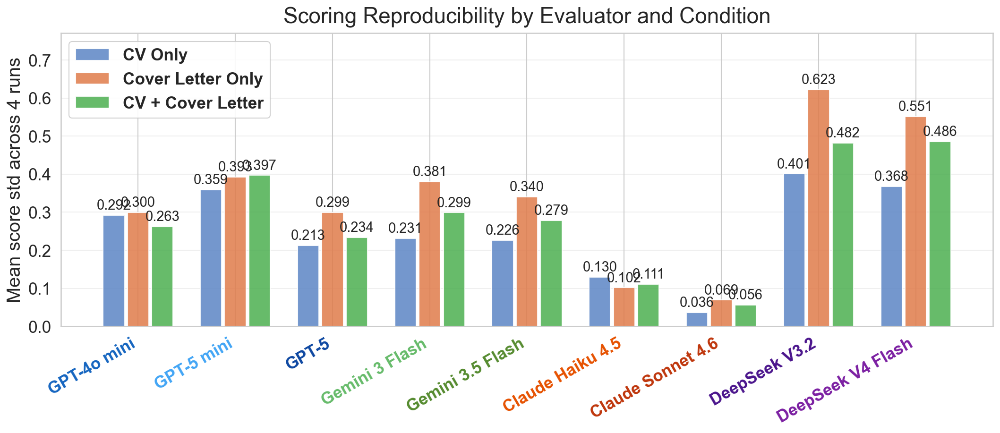

In [2]:
display(Image(f"{PAPER_DIR}/intra_run_variance.png", width=1200))

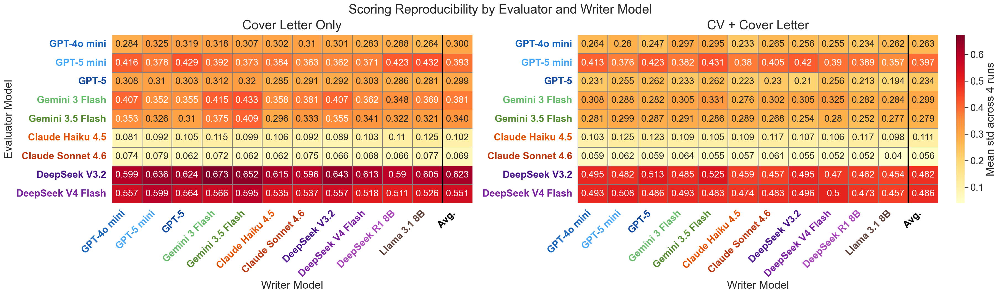

In [3]:
display(Image(f"{PAPER_DIR}/intra_run_variance_heatmap.png", width=1200))

In [4]:
conditions = [("cv_only", "CV Only"), ("cl_evaluations", "Cover Letter Only"),
              ("cv_cl_evaluations", "CV + Cover Letter")]

def run_std(sub, etype):
    grp = ["Job_ID", "CV_Idx", "Evaluator"] if etype == "cv_only" else ["Job_ID", "CV_Idx", "Evaluator", "Writer"]
    return sub.groupby(grp)["Score"].std()

rows = {}
for etype, label in conditions:
    sub   = master_df[master_df["Eval_Type"] == etype]
    stds  = run_std(sub, etype)
    rows[label] = {ev: stds.xs(ev, level="Evaluator").mean() for ev in UNIQUE_EVALUATORS}

repro = pd.DataFrame(rows)
repro.index = [MODEL_DISPLAY[e] for e in repro.index]
repro["Avg"] = repro.mean(axis=1)
display(repro.sort_values("Avg").round(3))


,CV Only,Cover Letter Only,CV + Cover Letter,Avg
Claude Sonnet 4.6,0.036,0.069,0.056,0.054
Claude Haiku 4.5,0.130,0.102,0.111,0.114
GPT-5,0.213,0.299,0.234,0.248
Gemini 3.5 Flash,0.226,0.340,0.279,0.282
GPT-4o mini,0.292,0.300,0.263,0.285
Gemini 3 Flash,0.231,0.381,0.299,0.303
GPT-5 mini,0.359,0.393,0.397,0.383
DeepSeek V4 Flash,0.368,0.551,0.486,0.468
DeepSeek V3.2,0.401,0.623,0.482,0.502


**Key findings:**
- **Claude Sonnet 4.6 is now the most reproducible evaluator by a wide margin** (avg σ = 0.054,
  roughly half of the next-best Claude Haiku 4.5 at 0.114).
- **DeepSeek models are now the least reproducible** (DeepSeek V3.2: 0.50, DeepSeek V4 Flash: 0.47) —
  a reversal from the old roster, where DeepSeek Chat was mid-pack (0.25).
- The **Cover-Letter-Only condition is still the noisiest** on average (0.34 vs. 0.25–0.29 for the
  other two), consistent with the paper's finding that ambiguous, style-only judgments are less stable.


---
## 2. What Do Models Produce?

Writing-style feature profiles across the 11 writers and two candidate tiers
(High-Fit = CV_Idx 1–25, Moderate-Fit = 26–50).


### 2a. Length & Surface Structure

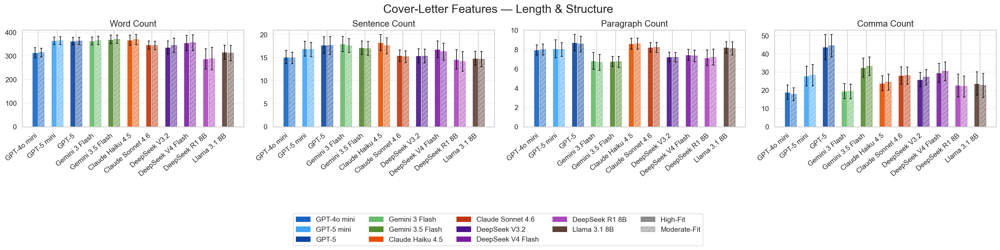

In [5]:
display(Image(f"{CL_DIR}/cl_features_length_structure.png", width=1200))

Word count, sentence count, paragraph count, and comma use. Models vary noticeably in verbosity —
some consistently write longer letters regardless of the candidate. Tier differences are generally
small (see §4 for the quantified effect sizes), suggesting length is more a model style than a
candidate-adaptive signal.


### 2b. Language Complexity

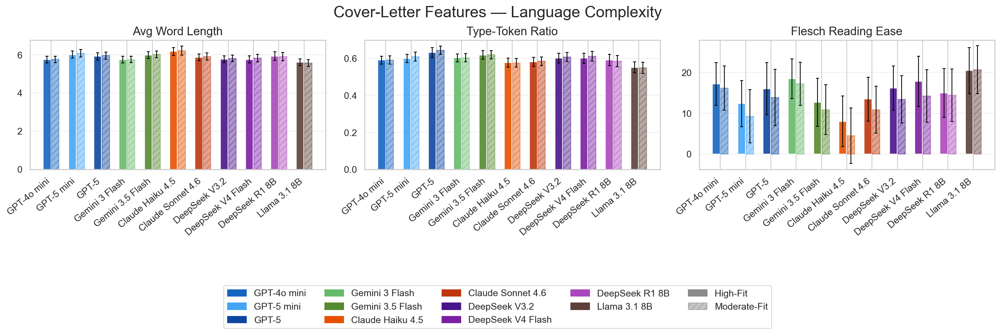

In [6]:
display(Image(f"{CL_DIR}/cl_features_language_complexity.png", width=1200))

Average word length and type-token ratio (TTR) proxy **vocabulary richness**; Flesch Reading Ease
and Flesch-Kincaid Grade measure **readability**. §7 shows readability is in fact one of the
strongest style predictors of evaluator preference once semantic-fit cues are removed.

> **Flesch Reading Ease** is computed from average sentence length and average syllables per word.
> **Higher = easier to read, lower = harder.** Rough bands: 90–100 very easy (simple/children's
> text), 60–70 plain English understood by most adults, 30–50 fairly difficult/academic, 0–30 very
> difficult/dense. A writer model with a higher score produces simpler, more accessible prose.


### 2c. Sentiment & Affect

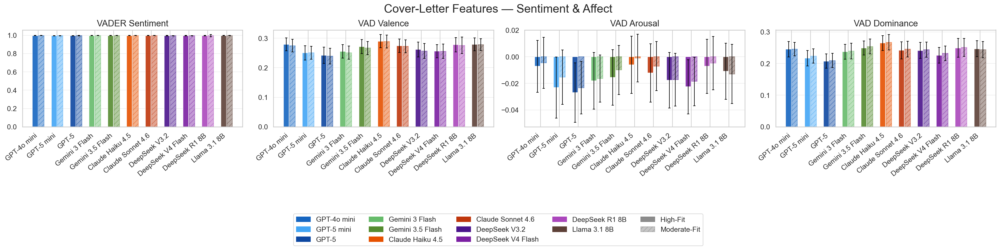

In [7]:
display(Image(f"{CL_DIR}/cl_features_sentiment_affect.png", width=1200))

- **VADER compound** and **VAD Valence** are both near-ceiling for all models — cover letters are
  uniformly positive, so this dimension does not discriminate between models.
- **VAD Arousal** captures energy level (excited/active vs. calm/measured).
- **VAD Dominance** captures assertiveness — §7 shows this is one of the higher-weighted features
  in evaluator preference when full features are used.

> **VAD (Valence-Arousal-Dominance)** is a dimensional emotion model — each axis is a continuous
> scale rather than a discrete emotion label:
> - **Valence** — positive vs. negative tone (high = "delighted", low = "disappointed"). Mostly
>   saturated/uninformative here since cover letters are uniformly positive.
> - **Arousal** — energy/intensity independent of polarity (high = "thrilled", low = "content").
>   Distinguishes a calm-positive letter from an energetic-positive one.
> - **Dominance** — control/confidence conveyed (high = "I will deliver", low = "I would hope to").
>   The most discriminating of the three, and the one with real predictive weight in §7.


### 2d. Emotion Profile

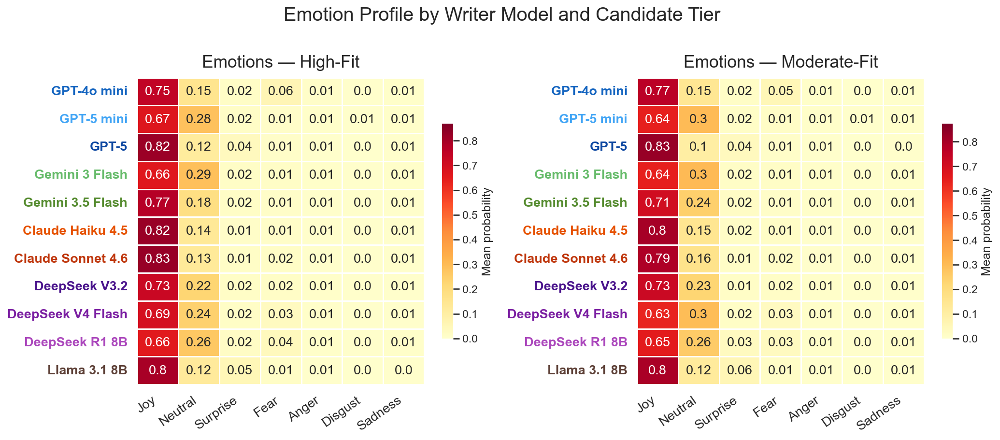

In [8]:
display(Image(f"{CL_DIR}/cl_features_emotions_heatmap.png", width=1200))

Mean emotion probability by model and tier. **Joy** and **Neutral** dominate, as expected for
professional writing. Differences between models are visible but modest.


### 2e. Semantic Fit to Job Description

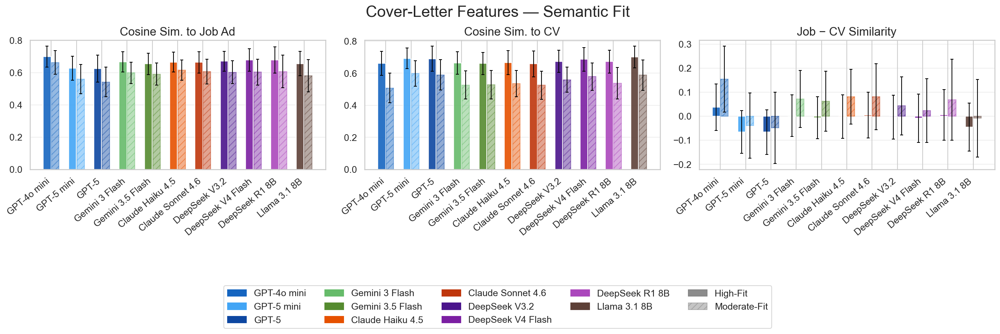

In [9]:
display(Image(f"{CL_DIR}/cl_features_semantic_fit.png", width=1200))

Cosine similarity between the cover-letter embedding and the job-description embedding. This is,
by a wide margin, the single feature evaluators weight most heavily when it's available (§7a).


---
## 3. Vocabulary and Topical Fingerprints

### 3a. Keyness — Lexical Fingerprints
Lemmas statistically over-represented for each model relative to all others pooled
(G² log-likelihood ratio).


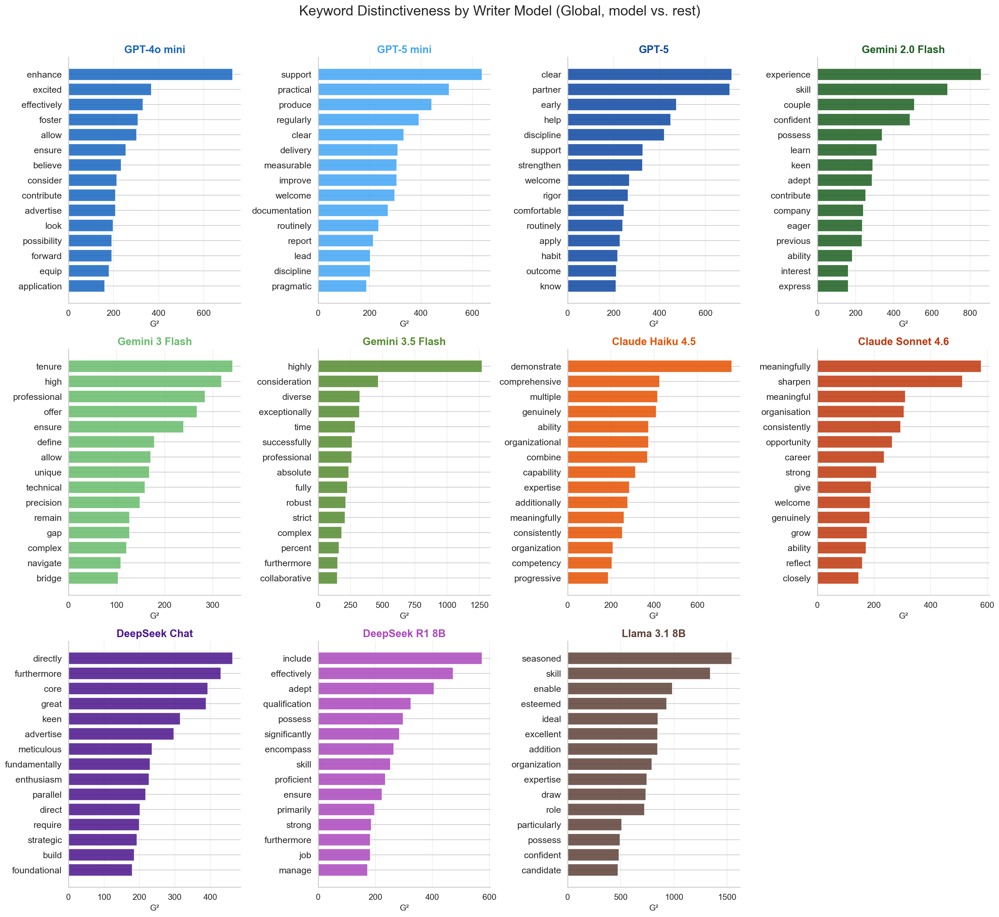

In [10]:
display(Image("output_plots/keyness/keyness_global.png"))

Despite semantic convergence across models (§5), each has a distinctive vocabulary — a fingerprint
invisible in embedding space that may be part of what evaluators (or keyness-sensitive readers)
pick up on.


### 3b. Empath — Topical Overrepresentation
For each model, Empath categories overrepresented vs. all other models pooled (Cohen's d).


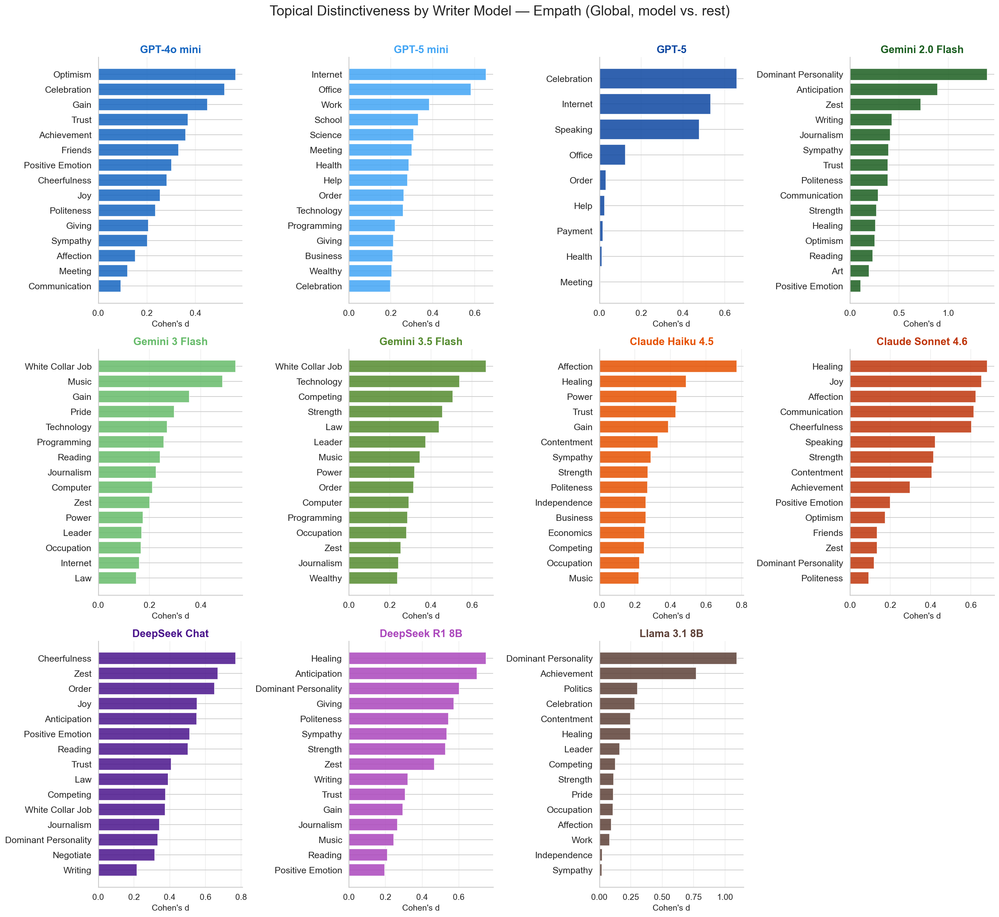

In [11]:
display(Image("output_plots/empath/empath_global.png"))

Complements keyness at the level of broader topical categories (achievement, work,
positive_emotion, etc.) rather than individual lemmas — useful for spotting thematic emphasis
that a single-word analysis would miss (e.g. a model leaning on "leadership"/"teamwork" language
generally, not just specific words).


---
## 4. Are Models Consistent Across Candidates?

Does a model write essentially the same letter for all 50 candidates on a given job, or adapt to
each individual CV?


### 4a. Embedding Homogeneity

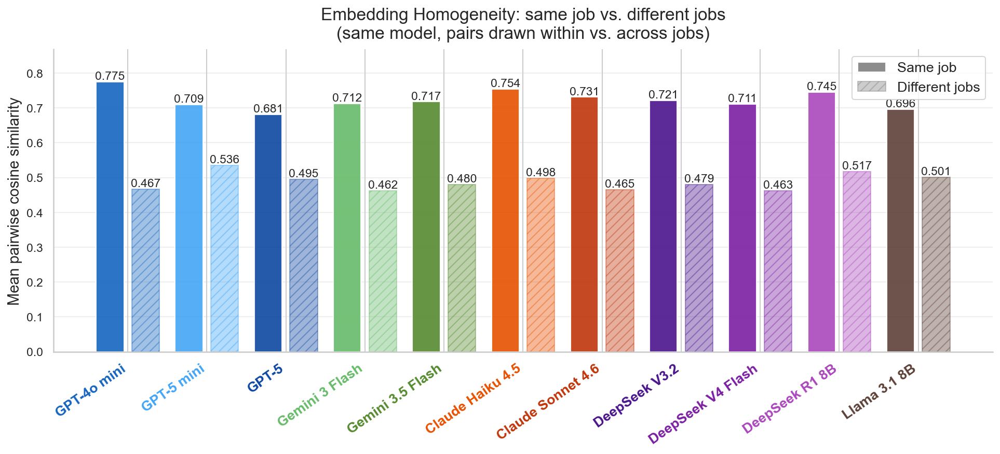

In [12]:
display(Image(f"{CL_DIR}/cl_embedding_homogeneity.png", width=1200))

In [13]:
rows = []
for writer in RAW_WRITERS:
    sub     = df[df["Writer"] == writer].copy()
    job_ids = sub["Job_ID"].to_numpy(dtype=str)
    embs    = np.array(sub["embedding"].tolist(), dtype=np.float32)
    norms   = np.linalg.norm(embs, axis=1, keepdims=True)
    embs    = embs / np.where(norms == 0, 1, norms)
    sim     = embs @ embs.T
    same    = (job_ids[:, None] == job_ids[None, :])
    n       = len(embs)
    upper   = np.triu_indices(n, k=1)
    s, mask = sim[upper], same[upper]
    rows.append({"Model":       MODEL_DISPLAY[writer],
                 "Within-job":  round(float(s[mask].mean()),  4),
                 "Cross-job":   round(float(s[~mask].mean()), 4)})

hom = (pd.DataFrame(rows).set_index("Model")
         .sort_values("Within-job", ascending=False))
hom["Gap (within − cross)"] = (hom["Within-job"] - hom["Cross-job"]).round(4)
display(hom)


,Within-job,Cross-job,Gap (within − cross)
Model,,,
GPT-4o mini,0.7750,0.4666,0.3084
Claude Haiku 4.5,0.7542,0.4979,0.2563
DeepSeek R1 8B,0.7445,0.5170,0.2275
Claude Sonnet 4.6,0.7308,0.4649,0.2659
DeepSeek V3.2,0.7215,0.4795,0.2420
Gemini 3.5 Flash,0.7174,0.4799,0.2375
Gemini 3 Flash,0.7117,0.4622,0.2495
DeepSeek V4 Flash,0.7112,0.4629,0.2483
GPT-5 mini,0.7086,0.5358,0.1728


**Key finding:** within-job similarity (0.68–0.78) is far higher than cross-job (0.46–0.54) for
every writer — the *job description* drives semantic content; models adapt to the job, not the
candidate. **GPT-4o mini is now the most homogeneous** writer, and **GPT-5 preserves the most
individuality** (lowest within-job similarity, 0.68) — a change from the old roster, where Llama
3.1 8B held that position. **GPT-5 mini has the smallest within/cross-job gap** (0.17), meaning its
letters vary least with the job description specifically.


### 4b. Do Models Write Differently for Strong vs. Weak Candidates?

§2 already shows each feature split by tier, model by model — this section asks the same question
more precisely: for every writing-style feature, how *big* is the High-Fit vs. Moderate-Fit
difference, on a scale that's comparable across features (Cohen's d, a standardized effect size)?
Semantic-fit features (cosine similarity to the job ad / CV) are excluded here because their tier
effect is near-definitional — a high-fit CV is by construction closer to the job, so a cover letter
echoing it will be too. That's not a stylistic finding.


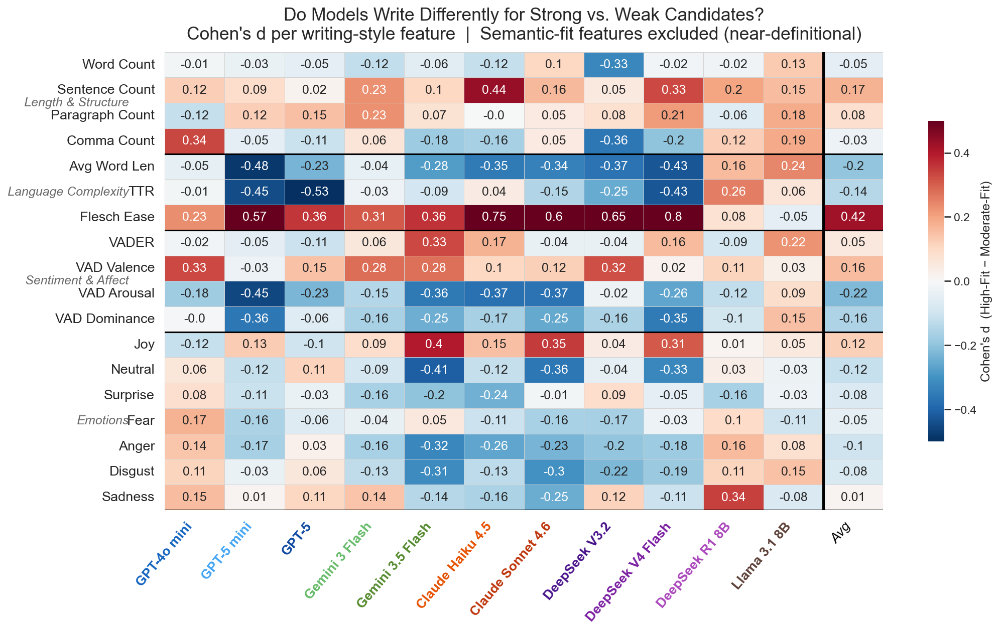

In [14]:
display(Image(f"{CL_DIR}/cl_tier_effect_heatmap.png", width=1200))

**Key finding:** style differences between high-fit and moderate-fit letters are small overall
(most |d| < 0.3), with one clear exception — **Flesch Reading Ease is consistently higher for
high-fit candidates** across almost every writer (up to d=+0.8 for DeepSeek V4 Flash and Claude
Sonnet 4.6), i.e. **letters for stronger candidates are written in simpler, easier-to-read
language**. The next-largest pattern is the mirror image: **Avg Word Length, TTR, VAD Arousal, and
VAD Dominance skew slightly negative** for several models — high-fit letters use marginally
shorter words, less lexical variety, and calmer/less assertive tone. Emotion features (joy, anger,
fear, sadness, etc.) show no consistent direction. **GPT-5 and Llama 3.1 8B barely adapt to tier at
all** (near-zero across the board); **DeepSeek and Claude models adapt the most**, primarily via
readability.


---
## 5. Are Models Semantically Similar to Each Other?


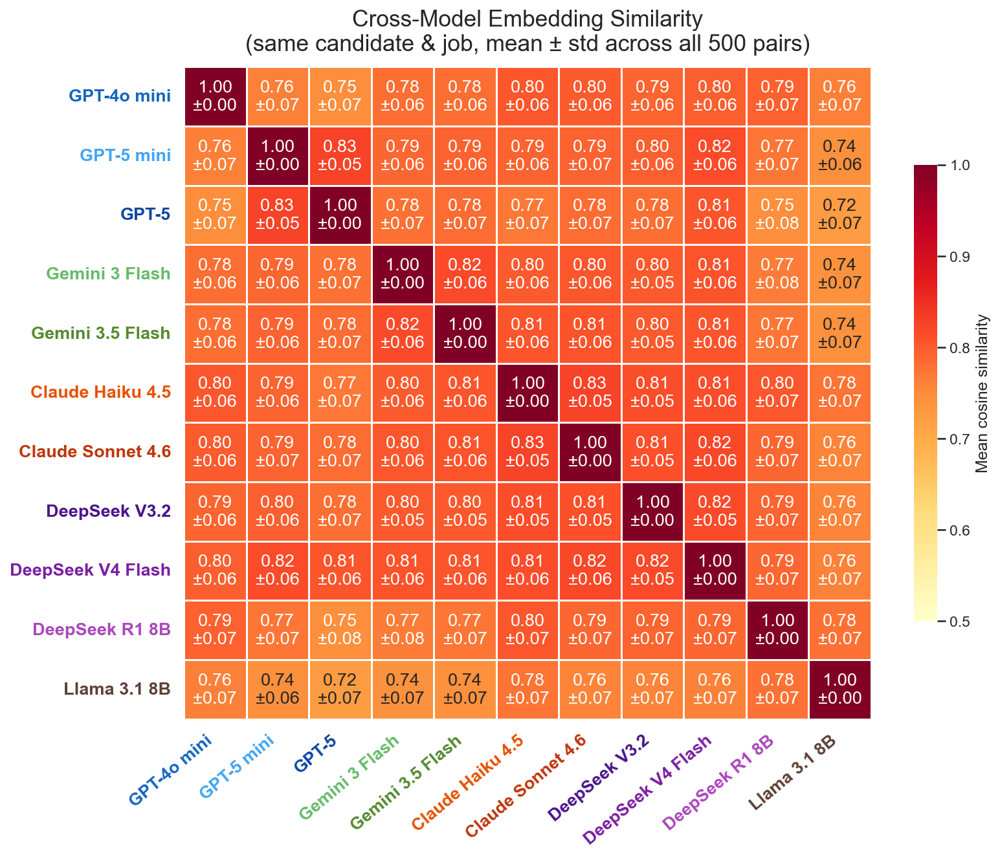

In [15]:
display(Image(f"{CL_DIR}/cl_cross_model_similarity.png", width=1200))

Mean cosine similarity between embeddings from two different models for the same candidate.
Semantic content converges across models even though lexical fingerprints (§3) differ —
the differentiation between models happens below the embedding level.


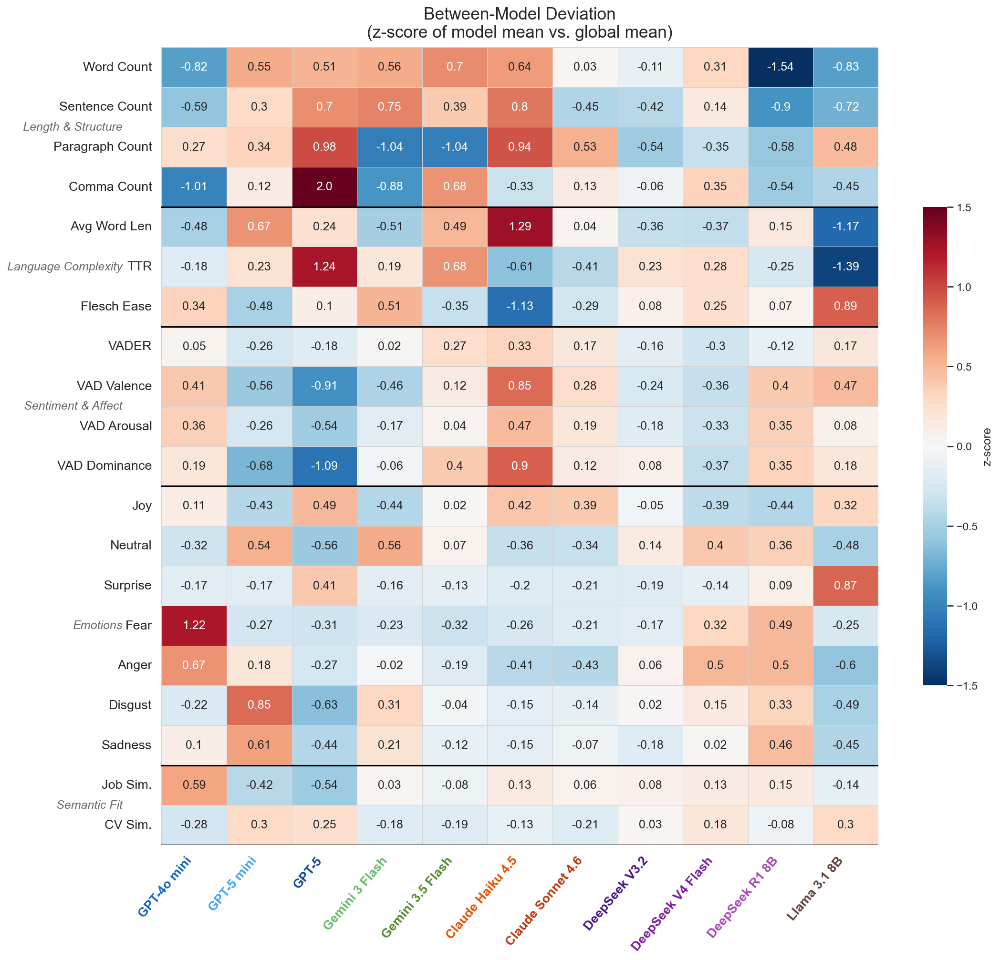

In [16]:
display(Image(f"{CL_DIR}/cl_between_model_deviation.png", width=1200))

Z-score of each model's mean feature value relative to the global mean — where each model's stylistic profile deviates from the pack.

---
## 6. What Do Evaluator Models Reward?

Spearman ρ between each text feature and score, per evaluator, in both cover-letter conditions.


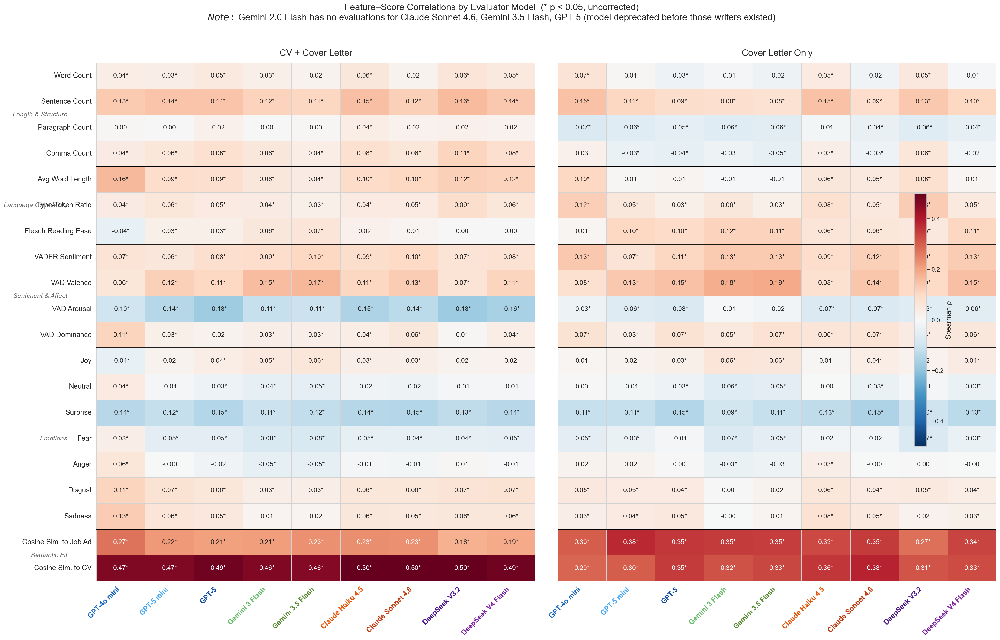

In [17]:
display(Image(f"{CL_DIR}/feature_score_corr.png", width=1200))

**Key findings (consistent with the regression in §7):**
- **Cosine similarity to the job description** is one of the most consistently rewarded features.
- **VAD Dominance** (assertive language) shows positive correlations for several evaluators.
- **Sentiment features** show weak/inconsistent effects, consistent with their uniformity across models.
- Meaningful **evaluator heterogeneity**: evaluators do not all reward the same features.


---
## 7. Does Writing Style Explain *Which* Writer an Evaluator Prefers?

Per-evaluator Ridge regression (`Score ~ standardized features`, within-job demeaned, RidgeCV /
LOO-CV alpha — plain OLS was unstable due to emotion-feature multicollinearity) gives each
evaluator's feature weights. Dotting those weights with each writer's mean feature profile yields a
**predicted preference matrix** (evaluator × writer), compared against the actual centred score gap.
Two variants: **full** features (incl. cosine similarity to job ad / CV) and **style-only**
(cosine similarities excluded — isolates pure writing style).


### 7a. What Does Each Evaluator Reward?

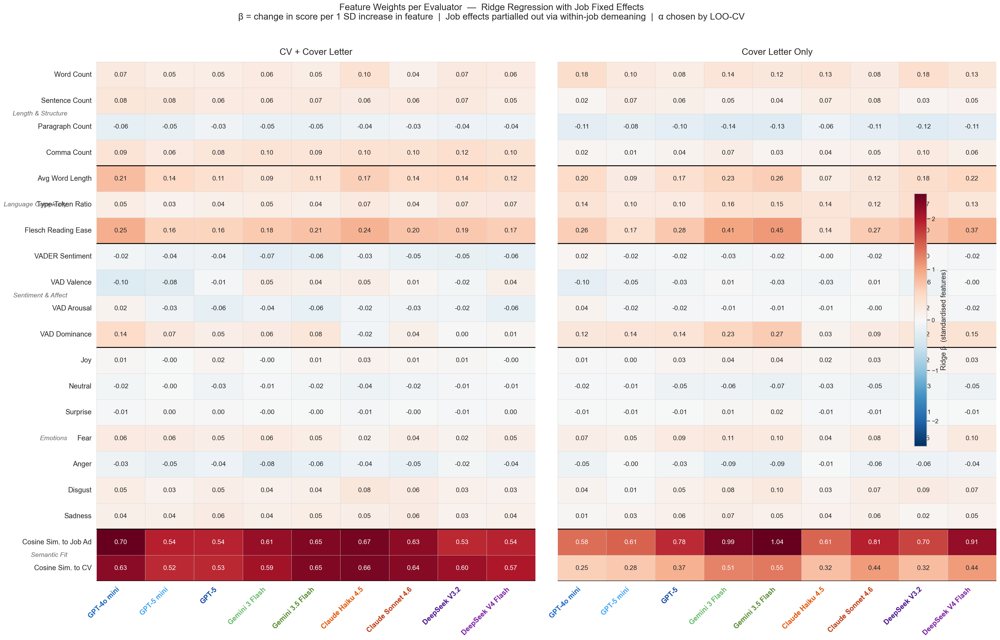

In [18]:
display(Image(f"{CL_DIR}/regression_coef_heatmap.png", width=1200))

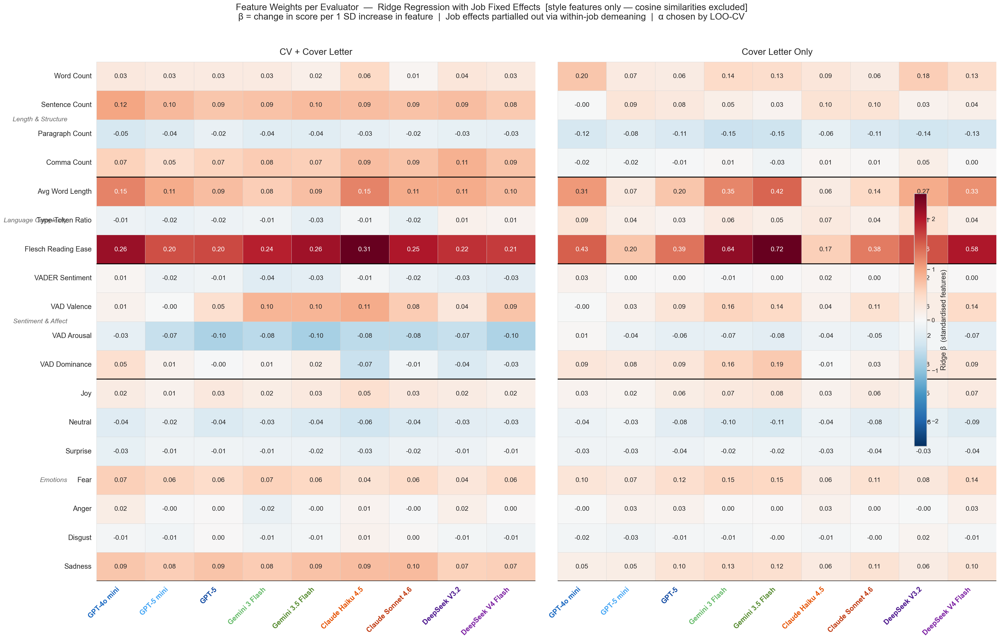

In [19]:
display(Image(f"{CL_DIR}/regression_coef_heatmap_style.png", width=1200))

In [20]:
feat_df = pd.read_parquet(pfr.FEATURES_PATH).drop(columns=["embedding"], errors="ignore")
scores_ft = (master_df[master_df["Eval_Type"].isin(pfr.EVAL_TYPES)]
             .groupby(["Job_ID", "Writer", "CV_Idx", "Evaluator", "Eval_Type"])["Score"]
             .mean().reset_index())
merged = scores_ft.merge(feat_df, on=["Job_ID", "Writer", "CV_Idx"])

coef_full,  *_ = pfr.fit_regressions(merged, "cl_evaluations", pfr.FEATURE_COLS)
coef_style, *_ = pfr.fit_regressions(merged, "cl_evaluations", pfr.STYLE_COLS)

print("Top 5 features by mean |coefficient| across evaluators — Cover Letter Only")
print("\nFull feature set:")
display(coef_full.abs().mean().sort_values(ascending=False).head(5).rename(index=pfr.FEATURE_LABELS))
print("\nStyle-only:")
display(coef_style.abs().mean().sort_values(ascending=False).head(5).rename(index=pfr.FEATURE_LABELS))


Top 5 features by mean |coefficient| across evaluators — Cover Letter Only

Full feature set:


Cosine Sim. to Job Ad    0.780665
Cosine Sim. to CV        0.387448
Flesch Reading Ease      0.293556
Avg Word Length          0.170113
VAD Dominance            0.143039
dtype: float64


Style-only:


Flesch Reading Ease    0.440647
Avg Word Length        0.240434
Paragraph Count        0.116617
Word Count             0.116018
Fear                   0.109305
dtype: float64

**Key finding:** with cosine similarity available, **job-ad similarity dominates** every other
feature (mean |β| ≈ 0.78 vs. 0.39 for cosine-to-CV, the next highest). Restricted to pure style,
evaluators fall back on **readability (Flesch Reading Ease) and word length** — absent an explicit
semantic-fit cue, simpler, easier-to-read prose is rewarded most.


### 7b. Predicted vs. Actual Preference

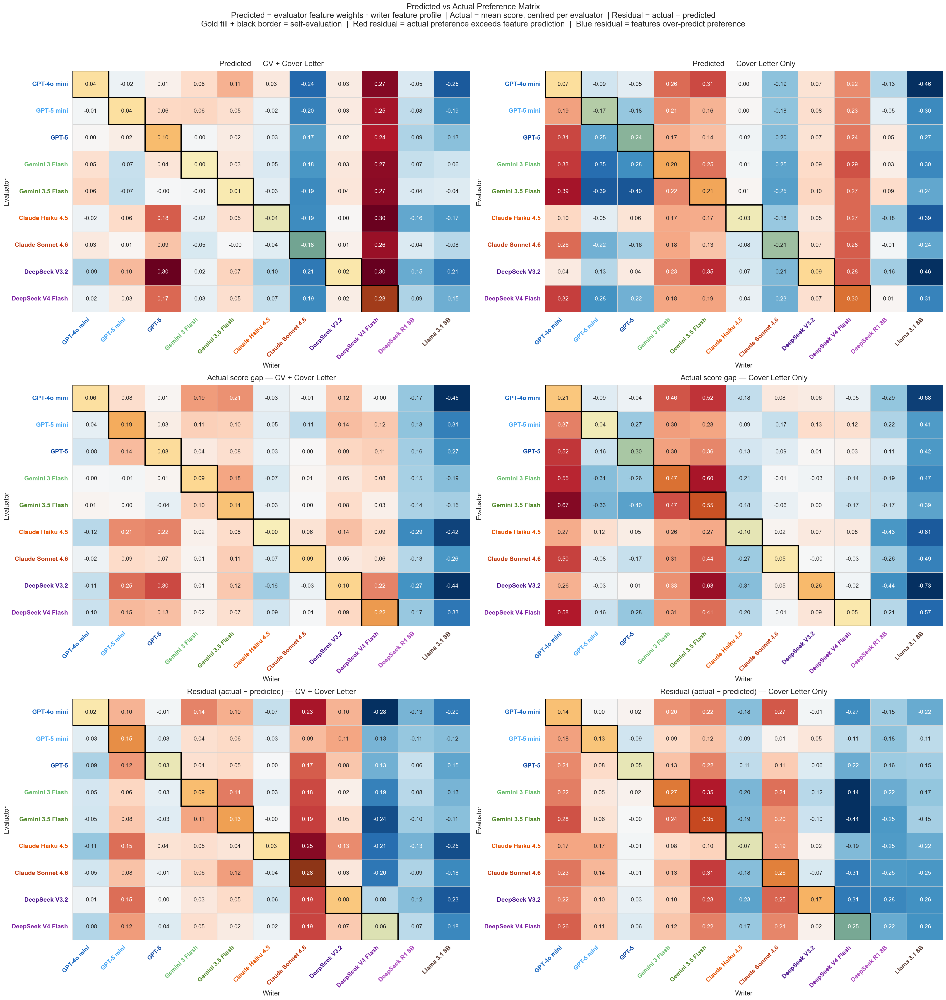

In [21]:
display(Image(f"{CL_DIR}/predicted_preference_matrix.png", width=1200))

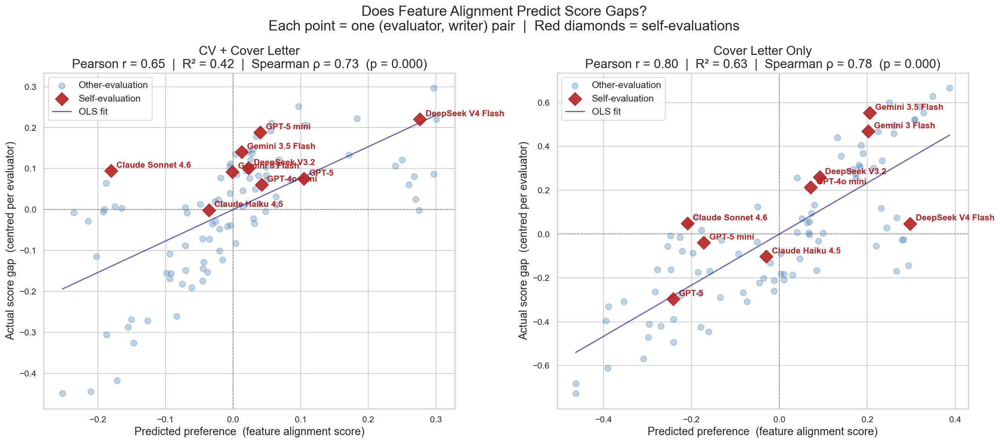

In [22]:
display(Image(f"{CL_DIR}/predicted_vs_actual_scatter.png", width=1200))

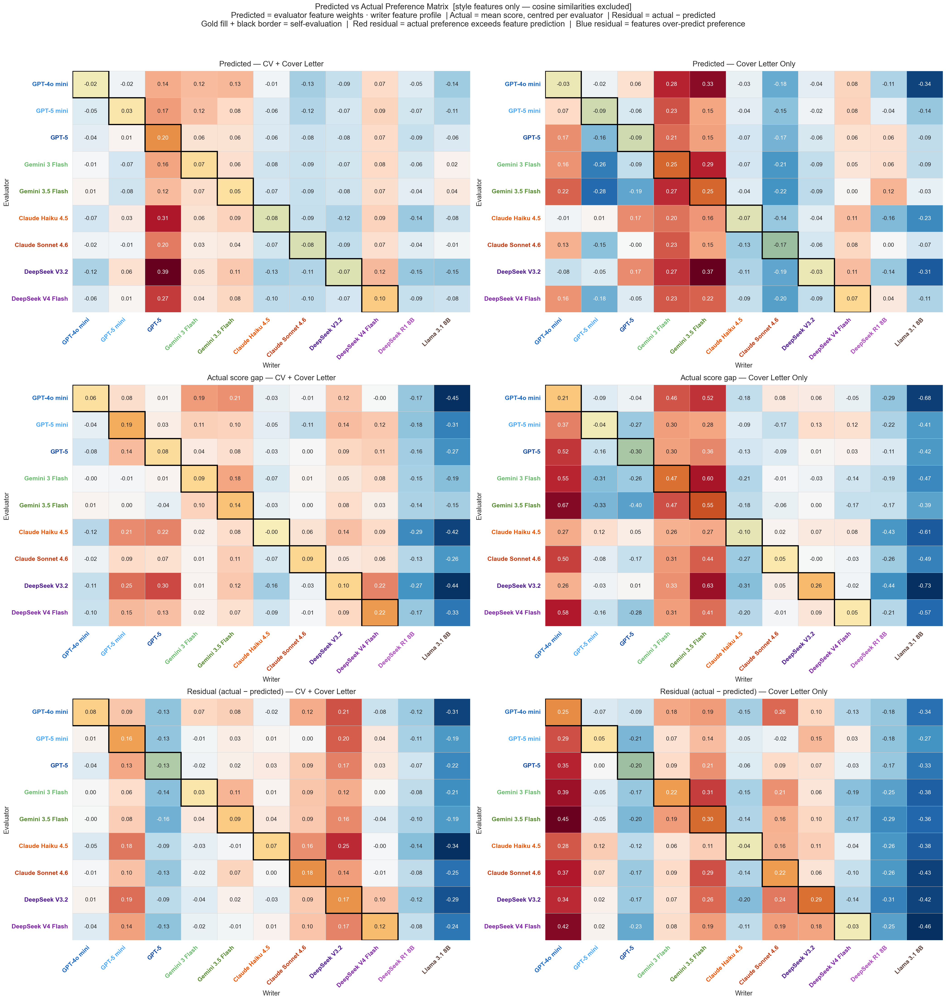

In [23]:
display(Image(f"{CL_DIR}/predicted_preference_matrix_style.png", width=1200))

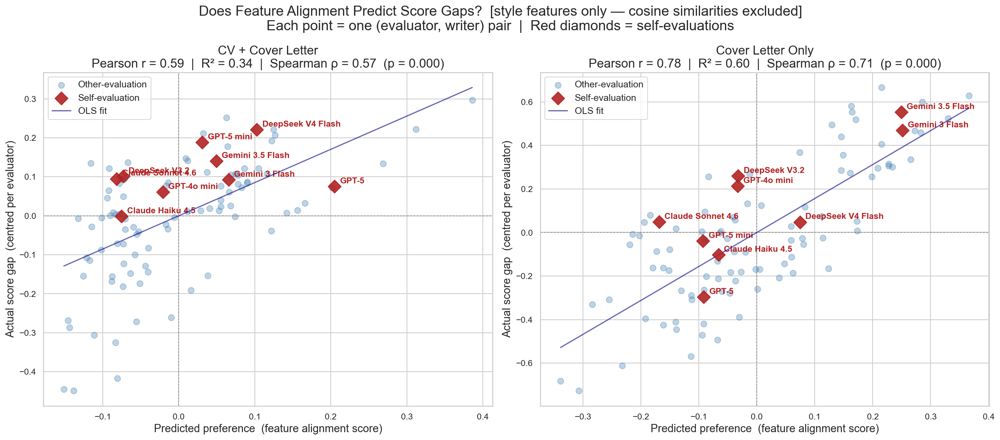

In [24]:
display(Image(f"{CL_DIR}/predicted_vs_actual_scatter_style.png", width=1200))

In [25]:
from scipy import stats as sst

print(f"{'Variant':<12}{'Eval_Type':<20}{'Pearson r':>10}{'R2':>8}{'Spearman rho':>14}")
for feat_cols, variant in [(pfr.FEATURE_COLS, "full"), (pfr.STYLE_COLS, "style")]:
    for eval_type in pfr.EVAL_TYPES:
        coef_df, feat_means, feat_stds = pfr.fit_regressions(merged, eval_type, feat_cols)
        profiles = pfr.writer_profiles(feat_df, feat_means, feat_stds, feat_cols)
        pred, actual = pfr.predicted_pref(coef_df, profiles, feat_cols), pfr.actual_pref(merged, eval_type)
        evals, writers = pred.index, pred.columns
        actual = actual.loc[evals, writers]
        p, a = pred.values.flatten(), actual.values.flatten()
        mask = ~np.isnan(p) & ~np.isnan(a)
        r, _   = sst.pearsonr(p[mask], a[mask])
        rho, _ = sst.spearmanr(p[mask], a[mask])
        print(f"{variant:<12}{pfr.EVAL_TYPES[eval_type]:<20}{r:>10.3f}{r**2:>8.3f}{rho:>14.3f}")


Variant     Eval_Type            Pearson r      R2  Spearman rho


full        CV + Cover Letter        0.645   0.417         0.725


full        Cover Letter Only        0.797   0.635         0.778


style       CV + Cover Letter        0.587   0.344         0.574


style       Cover Letter Only        0.776   0.602         0.714


**Key finding:** feature alignment strongly predicts writer preference — R² = 0.64 (full) / 0.60
(style-only) for Cover-Letter-Only, and 0.42 / 0.34 for CV+Cover-Letter. Style alone, with *no*
semantic-fit cue, still explains the majority of preference variance: writing style is a primary
channel through which writer identity reaches the score, not a minor confound.


### 7c. Common Preference vs. Genuine Self-Preference

The diagonal of the predicted-preference matrix (§7b) looks like "self-preference": a model's own
style predicts it will score well with itself. But that can happen for two very different reasons:

- **Common preference** — the writer's style happens to be liked by evaluators *in general*
  (e.g. it's simply more readable), so it scores well with everyone, itself included. Nothing
  self-referential about it.
- **Genuine (idiosyncratic) self-preference** — a model specifically overweights *its own*
  stylistic quirks more than an average evaluator would.

To tell them apart: **common preference** = (average evaluator's taste) applied to a writer's
style. **Idiosyncratic self-preference** = (a model's own taste *minus* the average taste) applied
to *its own* style — i.e. what's left over after removing the part every evaluator would already like.


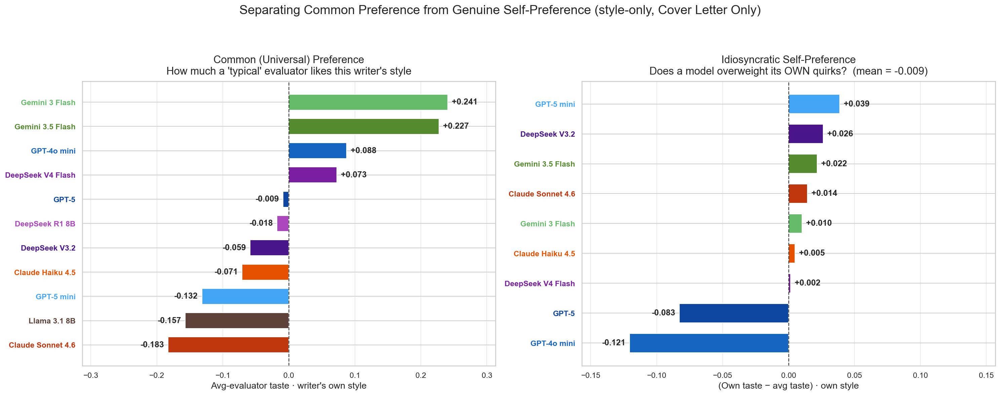

In [26]:
display(Image(f"{CL_DIR}/common_vs_self_preference.png", width=1200))

**Key finding:** common preference is real and substantial — **Gemini 3 Flash (+0.24) and Gemini
3.5 Flash (+0.23) are broadly liked by essentially every evaluator** (mainly via readability),
while **Claude Sonnet 4.6 (−0.18) and Llama 3.1 8B (−0.16) are broadly disliked stylistically** —
this has nothing to do with who's judging. Genuine idiosyncratic self-preference, once common
preference is subtracted out, is **close to zero on average (mean = −0.009)**: most models don't
specifically overvalue their own quirks (GPT-5 mini +0.04, DeepSeek V3.2 +0.03 are the largest
positive cases; GPT-4o mini −0.12 and GPT-5 −0.08 actually *undervalue* their own style). So what
looked like style-based self-preference is mostly common preference in disguise — which makes §7d's
finding below more notable, not less: if self-preference still shows up in actual scores after
removing style-predicted preference entirely, that bias isn't "a model likes its own writing style,"
it's something else entirely.


### 7c-ii. Which Features Actually Drive These Scores?

The bars above are totals — this breaks each one down feature by feature, so it's clear exactly
*why* a writer is broadly liked/disliked, and *why* a model's self-preference is near zero rather
than just asserting that it is. Contribution = evaluator taste × writer's own standardized style,
so a large value means "this writer's style stands out a lot on this feature, and evaluators care a
lot about that feature." The rightmost column (Avg |contrib|) ranks features by how much they
matter on average across writers — i.e. **what evaluators privilege overall**.


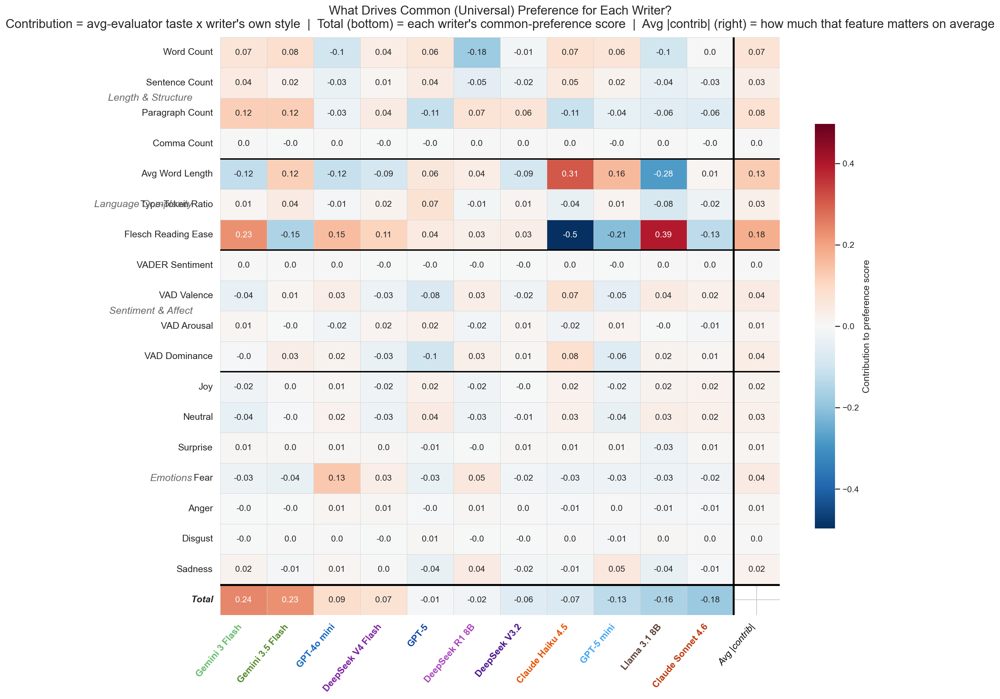

In [27]:
display(Image(f"{CL_DIR}/common_preference_drivers.png", width=1200))

**Key finding:** **Flesch Reading Ease is the single most impactful feature overall** (Avg
|contrib| = 0.18, roughly double the next-highest, Avg Word Length at 0.13) — it's what most
separates broadly-liked from broadly-disliked writers. Gemini 3 Flash's +0.24 common preference is
driven almost entirely by high readability (+0.23); Claude Haiku 4.5's largest single driver is the
*opposite* — very low readability (−0.50) — though this is partly offset by long average word
length cutting the other way (+0.31), landing its total at only −0.07. Claude Sonnet 4.6's −0.18 is
more diffuse: modestly-below-average readability (−0.13) plus small negative contributions from
paragraph and sentence count, with no single dominant feature or offsetting boost like Haiku's.
Emotions and sentiment barely register anywhere (Avg |contrib| ≤ 0.04) — readability and word
choice, not tone, are what evaluators are actually responding to.


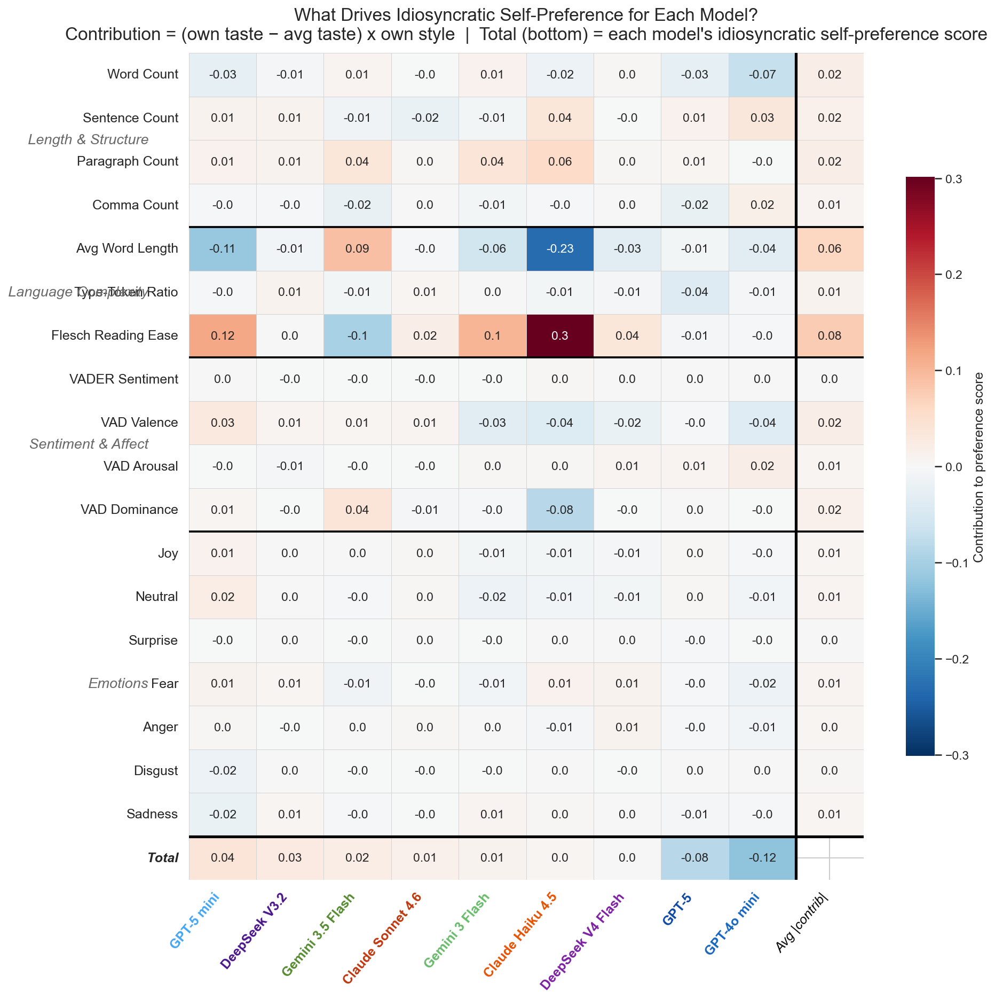

In [28]:
display(Image(f"{CL_DIR}/self_preference_drivers.png", width=1200))

**Key finding:** GPT-4o mini's −0.12 idiosyncratic self-preference isn't driven by one feature —
it's a diffuse combination of several small contributions (Word Count −0.07, VAD Valence −0.04,
Avg Word Length −0.03, none individually dominant). Claude Haiku 4.5's total is near zero (+0.005),
but that's a cancellation, not an absence of effect: **Haiku's own taste for readability (0.17) is
much lower than the average evaluator's (0.44)** — it cares less about readability than a typical
judge — and since Haiku's own writing is by far the least readable in the roster (z = −1.13), that
"not caring as much" works in its favor (+0.30 contribution). But this is almost exactly cancelled
by average word length working the other way (−0.23). So idiosyncratic self-preference isn't simply
absent for these models — it can be a real, sizeable effect on individual features that happens to
net out, which the "Total" row alone would hide.


### 7d. Does Self-Preference Survive After Controlling for Style?

In [29]:
coef_df, feat_means, feat_stds = pfr.fit_regressions(merged, "cl_evaluations", pfr.STYLE_COLS)
profiles = pfr.writer_profiles(feat_df, feat_means, feat_stds, pfr.STYLE_COLS)
pred   = pfr.predicted_pref(coef_df, profiles, pfr.STYLE_COLS)
actual = pfr.actual_pref(merged, "cl_evaluations")
common_e = [e for e in pred.index if e in actual.index]
common_w = [w for w in pred.columns if w in actual.columns]
pred, actual = pred.loc[common_e, common_w], actual.loc[common_e, common_w]
resid = actual - pred

diag    = [resid.loc[e, e] for e in common_e if e in common_w]
offdiag = [resid.loc[e, w] for e in common_e for w in common_w if e != w]
print(f"Self-evaluation residual   (actual − style-predicted):  mean = {np.mean(diag):+.3f}  (n={len(diag)})")
print(f"Other-evaluation residual  (actual − style-predicted):  mean = {np.mean(offdiag):+.3f}  (n={len(offdiag)})")


Self-evaluation residual   (actual − style-predicted):  mean = +0.118  (n=9)
Other-evaluation residual  (actual − style-predicted):  mean = -0.012  (n=90)


**Key finding:** even after the writer's own style *fully* accounts for its predicted preference
(full style profile, not just the idiosyncratic part), **self-evaluations still score +0.12 above
what style predicts**, while other-evaluations score essentially on-target (−0.01). Combined with
§7c, this pins down where the self-preference bias actually lives: not in "a model finding its own
stylistic quirks unusually appealing" (that part is ~0), but in something entirely outside the
measured style features — plausibly literal self-recognition of the text, or an unmeasured channel.


---
## 8. What Structurally Predicts a Score?

Zooming out from style: how much of the score is explained by evaluator, writer, candidate fit
tier, and job — individually and combined?


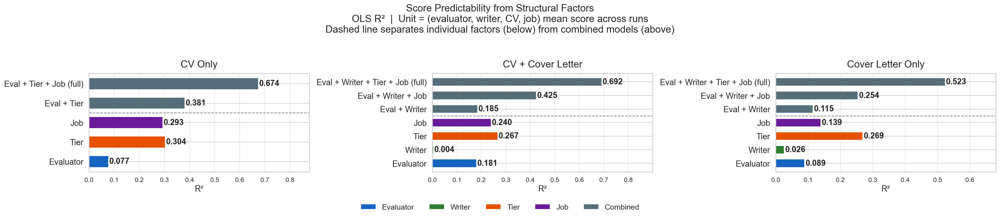

In [30]:
display(Image(f"{CL_DIR}/score_variance_decomposition.png", width=1200))

In [31]:
rows = []
for et in scores["Eval_Type"].unique():
    sub        = scores[scores["Eval_Type"] == et]
    has_writer = sub["Writer"].nunique() > 1
    preds      = ["Evaluator", "Writer", "Tier", "Job_ID"] if has_writer else ["Evaluator", "Tier", "Job_ID"]
    row = {"Eval_Type": psd.EVAL_TYPES[et]}
    for p in preds:
        row[p] = round(psd.r2_ols(sub, [p]), 3)
    row["Full model"] = round(psd.r2_ols(sub, preds), 3)
    rows.append(row)
display(pd.DataFrame(rows).set_index("Eval_Type"))


,Evaluator,Writer,Tier,Job_ID,Full model
Eval_Type,,,,,
Cover Letter Only,0.089,0.026,0.269,0.139,0.523
CV + Cover Letter,0.181,0.004,0.267,0.240,0.692
CV Only,0.077,NaN,0.304,0.293,0.674


**Key findings:**
- **Fit tier dominates single-factor R²** (0.27–0.30 across all three conditions).
- **Writer model explains very little on its own** (R² ≈ 0.03 Cover-Letter-Only, ≈ 0.004 CV+CL).
- **Job identity** is substantial (R² 0.14–0.29): jobs are scored on different baselines.
- The full combined model reaches R² = 0.52–0.69 — most addressable variance is structural.


### 8a. Tier Sensitivity — Do Evaluators Correctly Discriminate Quality?

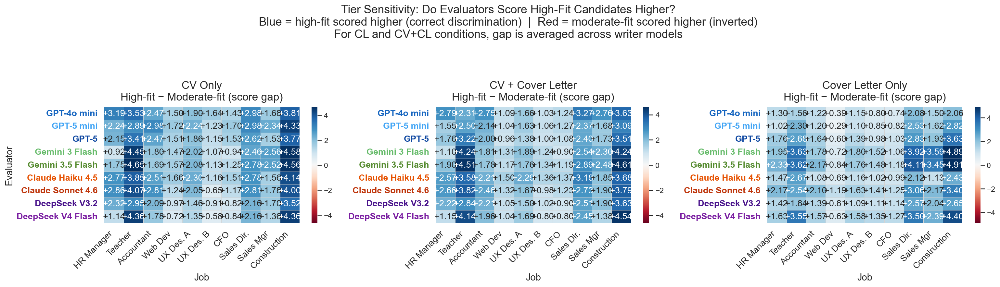

In [32]:
display(Image(f"{CL_DIR}/tier_sensitivity_heatmap.png", width=1200))

In [33]:
for et in ["cv_only", "cv_cl_evaluations", "cl_evaluations"]:
    sub = scores[scores["Eval_Type"] == et]
    tm  = sub.groupby(["Evaluator", "Job_ID", "Tier"])["Score"].mean().unstack("Tier")
    gap = tm["high_fit"] - tm["mod_fit"]
    print(f"{psd.EVAL_TYPES[et]:20s}  mean gap = {gap.mean():+.2f}  |  "
          f"positive in {(gap > 0).mean():.0%} of {len(gap)} (evaluator, job) pairs")


CV Only               mean gap = +2.25  |  positive in 100% of 90 (evaluator, job) pairs
CV + Cover Letter     mean gap = +2.12  |  positive in 100% of 90 (evaluator, job) pairs


Cover Letter Only     mean gap = +1.89  |  positive in 100% of 90 (evaluator, job) pairs


**Key finding:** every (evaluator, job) pair, in every condition, scores High-Fit above
Moderate-Fit — 100% consistent direction. The gap shrinks slightly as writing-dependent signal is
added (CV Only 2.25 → CV+CL 2.12 → CL Only 1.89), i.e. the cover letter dilutes but never overrides
the underlying CV-fit signal.


### 8b. Residual Writer-Model Effect

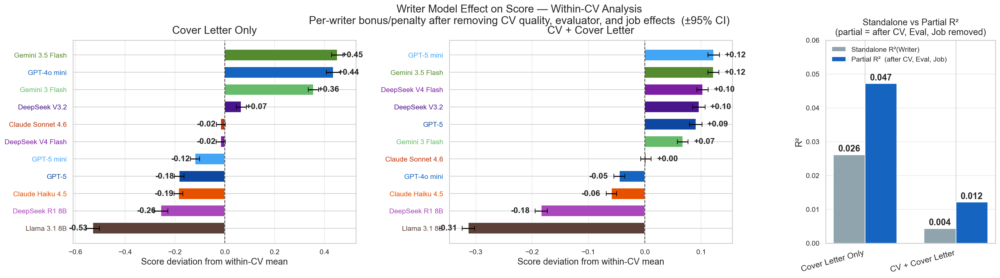

In [34]:
display(Image(f"{CL_DIR}/writer_effect_analysis.png", width=1200))

In [35]:
sub = scores[scores["Eval_Type"].isin(psd.ET_WRITER)].copy()
grp_mean = sub.groupby(["Eval_Type", "Evaluator", "CV_Idx", "Job_ID"])["Score"].transform("mean")
sub["writer_effect"] = sub["Score"] - grp_mean
agg = (sub.groupby(["Eval_Type", "Writer"])["writer_effect"]
       .agg(mean="mean", sem=lambda x: x.sem()).reset_index())
for et in psd.ET_WRITER:
    print(f"--- {psd.EVAL_TYPES[et]} ---")
    display(agg[agg["Eval_Type"] == et].sort_values("mean").set_index("Writer")[["mean", "sem"]].round(3))


--- Cover Letter Only ---


,mean,sem
Writer,,
llama3.1-8b,-0.531,0.014
deepseek-r1-8b,-0.257,0.014
claude-haiku-4-5,-0.186,0.009
gpt-5,-0.183,0.010
gpt-5-mini,-0.120,0.009
deepseek-v4-flash,-0.016,0.009
claude-4.6-sonnet,-0.016,0.009
deepseek-v3.2,0.066,0.010
gemini-3-flash-preview,0.356,0.011


--- CV + Cover Letter ---


,mean,sem
Writer,,
llama3.1-8b,-0.313,0.006
deepseek-r1-8b,-0.184,0.005
claude-haiku-4-5,-0.059,0.005
gpt-4o-mini,-0.045,0.005
claude-4.6-sonnet,0.002,0.005
gemini-3-flash-preview,0.067,0.005
gpt-5,0.090,0.006
deepseek-v3.2,0.096,0.006
deepseek-v4-flash,0.102,0.005


**Key findings:**
- After controlling for CV quality, evaluator, and job, writer effects are **small but real**:
  Llama 3.1 8B is penalised most (−0.53 Cover-Letter-Only, −0.31 CV+CL); Gemini 3.5 Flash / GPT-4o
  mini rank highest.
- The effect **roughly halves once a CV is present** — style matters more when it's the only signal.
- **Partial** R²(Writer | CV, Evaluator, Job) is 0.047 (CL-Only) / 0.012 (CV+CL) — larger than the
  *standalone* R²(Writer) (0.026 / 0.004), meaning the writer effect is partly confound-masked
  until CV/evaluator/job are controlled for.


---
## 9. Key Takeaways

| # | Finding |
|---|---|
| 1 | **Roster update changed reproducibility rankings**: Claude Sonnet 4.6 is now the most reproducible evaluator (σ=0.054); DeepSeek models are now the least (σ≈0.47–0.50), a reversal from before. |
| 2 | **Sentiment is uniformly positive** across all models — not a discriminating feature. |
| 3 | **Models adapt to the job, not the candidate** — within-job embedding similarity (0.68–0.78) far exceeds cross-job (0.46–0.54) for every writer. |
| 4 | **GPT-4o mini homogenises most; GPT-5 preserves individuality most** (roster-dependent — was Llama 3.1 8B before). |
| 5 | **Tier adaptation in writing style is small overall, with one consistent exception** — high-fit letters are written in simpler, easier-to-read language (Flesch Reading Ease up to d=+0.8 for some writers); most other style features barely move. |
| 6 | **Semantic content converges across models; lexical/topical fingerprints (keyness, Empath) do not.** |
| 7 | **Cosine similarity to the job ad dominates evaluator preference** when available; absent it, **readability and word length** take over. |
| 8 | **Style-based feature alignment explains most of predicted-vs-actual preference variance** (R² up to 0.64) — style is a primary channel for writer preference. |
| 9 | **What looks like style-based self-preference is mostly "common preference" in disguise** (Gemini models are just broadly liked, by every evaluator) — genuine idiosyncratic self-preference is ~0 on average. But **a residual self-preference of +0.12 in actual scores survives even after controlling for style entirely** — the real bias isn't "liking your own style," it's something style can't explain. |
| 10 | **Candidate fit tier is the strongest single structural driver of score** (R² 0.27–0.30) and is 100% directionally consistent; **writer model alone explains very little** (R² ≤ 0.03), though more once confounds are controlled for. |
